<a href="https://colab.research.google.com/github/pszemraj/ai-msgbot/blob/main/notebooks/colab-notebooks/hyperparameters/analyze_gridsearch_data.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Grid Search for Parameters

- optimal "text bot" hyperparamters are not really known, nor is there a right answer
- proposal: iterate through "reasonable" parameter ranges, record output, compute sentence coherence scoring on outputs
- evaluate results once finished

## formatting

In [ ]:
from IPython.display import HTML, display
# colab formatting
def set_css():
    display(
        HTML(
            """
  <style>
    pre {
        white-space: pre-wrap;
    }
  </style>
  """
        )
    )

get_ipython().events.register("pre_run_cell", set_css)

## GPU / CPU status

In [ ]:
from psutil import virtual_memory
import os
ram_gb = round(virtual_memory().total / (1024**3), 1)
print('Runtime has {} gigs of memory and {} processors'.format(ram_gb,
      os.cpu_count()))


Runtime has 12.7 gigs of memory and 2 processors


In [ ]:
!nvidia-smi

Thu Dec  2 09:26:54 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 495.44       Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla V100-SXM2...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   38C    P0    24W / 300W |      0MiB / 16160MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

# setup

In [ ]:
!pip install -U -q pandas
!pip uninstall -y -q pyarrow
!pip install -U -q pyarrow
!pip install -U -q openpyxl
import pandas as pd

In [ ]:
!pip3 install torch==1.10.0+cu113 torchvision==0.11.1+cu113 -f https://download.pytorch.org/whl/cu113/torch_stable.html -q
!pip install https://storage.googleapis.com/jax-releases/cuda111/jaxlib-0.1.71+cuda111-cp37-none-manylinux2010_x86_64.whl -q

In [ ]:
%%capture
!pip install -U tqdm
!pip install clean-text

import gc
import os
import pprint as pp
import time
import warnings
from datetime import datetime
from os.path import join


from tqdm.auto import tqdm
from cleantext import clean
warnings.filterwarnings(action="ignore", message=".*gradient_checkpointing*")

In [ ]:
!pip uninstall -y -q plotly
!pip install -U -q plotly
import plotly.express as px

In [ ]:

def create_folder(directory):
    os.makedirs(directory, exist_ok=True)


def shorten_title(title_text, max_no=35):
    if len(title_text) < max_no:
        return title_text
    else:
        return title_text[:max_no] + "..."


def cleantxt_wrap(ugly_text):
    # a wrapper for clean text with options different than default

    # https://pypi.org/project/clean-text/
    cleaned_text = clean(
        ugly_text,
        fix_unicode=True,  # fix various unicode errors
        to_ascii=True,  # transliterate to closest ASCII representation
        lower=True,  # lowercase text
        no_line_breaks=True,  # fully strip line breaks as opposed to only normalizing them
        no_urls=True,  # replace all URLs with a special token
        no_emails=True,  # replace all email addresses with a special token
        no_phone_numbers=True,  # replace all phone numbers with a special token
        no_numbers=False,  # replace all numbers with a special token
        no_digits=False,  # replace all digits with a special token
        no_currency_symbols=True,  # replace all currency symbols with a special token
        no_punct=True,  # remove punctuations
        replace_with_punct="",  # instead of removing punctuations you may replace them
        replace_with_url="<URL>",
        replace_with_email="<EMAIL>",
        replace_with_phone_number="<PHONE>",
        replace_with_number="<NUM>",
        replace_with_digit="0",
        replace_with_currency_symbol="<CUR>",
        lang="en",  # set to 'de' for German special handling
    )

    return cleaned_text

### dropbox 


- [tutorial](https://python.plainenglish.io/automate-your-pdf-upload-to-dropbox-python-script-bdacc2c721f6)
- [api docs](https://dropbox-sdk-python.readthedocs.io/en/latest/api/dropbox.html?highlight=files_upload#dropbox.dropbox_client.Dropbox.files_upload)

In [ ]:
dropbox_subfolder = "GPT text gen - Custom Model"  # @param {type:"string"}

In [ ]:
!pip install -q dropbox
import dropbox

In [ ]:
token = "create-your-own-see-tutorial" # you can use files.download(vm_path) instead

dbx = dropbox.Dropbox(token)
pp.pprint(dbx.users_get_current_account(), compact=True, indent=4)

FullAccount(account_id='dbid:AAAYVJX_n2JYa7yh6anfANmwSJ7qkr-u8Do', account_type=AccountType('pro', None), country='CH', disabled=False, email='peterszemraj@gmail.com', email_verified=True, is_paired=False, locale='en', name=Name(abbreviated_name='PS', display_name='Peter Szemraj', familiar_name='Peter', given_name='Peter', surname='Szemraj'), profile_photo_url='https://dl-web.dropbox.com/account_photo/get/dbaphid%3AAACl3aYwbYAysBHXpGdGBXZj6IYsXocikxc?size=128x128&vers=1628569648991', referral_link='https://www.dropbox.com/referrals/AAAVOEoeLmg4Nw7hRIA9Wsn8OMf2_EdGbik?src=app9-10920512', root_info=UserRootInfo(home_namespace_id='9560958', root_namespace_id='9560958'), team=NOT_SET, team_member_id=NOT_SET)


In [ ]:
def get_size_mb(path2file, verbose=False):

    file_stats = os.stat(path2file)

    file_size_mb = {file_stats.st_size / (1024 * 1024)}
    if verbose: print(f'File Size in MegaBytes is {file_size_mb}')
    return round(list(file_size_mb)[0],2) # returns rounded to 2 decimals

In [ ]:
from os.path import join, basename, dirname
import time, random
from google.colab import files

def put_in_dropbox(
    vm_path, subfolder=dropbox_subfolder, no_printout=True, ncalls=0, max_calls=3
):
    if ncalls > max_calls:
        files.download(vm_path)
        return "failed saving to DropBox - {} tries".format(ncalls)
    elif get_size_mb(vm_path) > 155:
        files.download(vm_path)
        return "file size of {} too big to put in DB, downloading".format(basename(vm_path))
    # for an item on the colab machine on path, upload to dropbox app folder at
    # subfolder/"filename"
    base_filename = basename(vm_path)
    db_path = "/{}/{}".format(subfolder, base_filename)
    try:
        with open(vm_path, "rb") as f:
            dbx.files_upload(f.read(), path=db_path, autorename=True, mute=no_printout)
    except:
        print(
            "WARNING - unable to post in dropbox, retry no. {} - ".format(ncalls + 1),
            datetime.now(),
        )
        time.sleep(random.randint(1, 3))  # small delay before trying again
        put_in_dropbox(vm_path, ncalls=ncalls + 1)  # recursion for retrying

In [ ]:
from datetime import date
# for filesaving purposes
today = date.today()
# Month abbreviation, day and year
today_string = today.strftime("%b-%d-%Y")
timestamp = datetime.now().strftime("%b-%d-%Y_%H-%M")


# Analysis

In [ ]:
dl_link = "https://www.dropbox.com/s/h2v80y78e8ceo3b/joined_fullmodel_report_Dec-02-2021_t-09.xlsx?dl=1" #@param {type:"string"}


In [ ]:
error_string = "<bro, there was an error. try again>"

df_analysis = pd.read_excel(dl_link, index_col=0).convert_dtypes()
df_analysis = df_analysis[df_analysis["model_response"] != error_string]
df_analysis.reset_index(drop=True, inplace=True)
df_analysis.info(verbose=True) # overview

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7500 entries, 0 to 7499
Data columns (total 6 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   temp            7500 non-null   Float64
 1   topk            7500 non-null   Int64  
 2   top_p           7500 non-null   Float64
 3   prompt          7500 non-null   string 
 4   speaker         7500 non-null   string 
 5   model_response  7500 non-null   string 
dtypes: Float64(2), Int64(1), string(3)
memory usage: 373.7 KB


assume the outputs are a single sentence and then use a [sentence-scoring algorithm on them](https://github.com/simonepri/lm-scorer) via `lm-scorer` package.

- [here](https://colab.research.google.com/github/simonepri/lm-scorer/blob/master/examples/lm_scorer.ipynb) is an example notebook

In [ ]:
!pip install -q lm-scorer

import torch
from lm_scorer.models.auto import AutoLMScorer as LMScorer

# Available models
list(LMScorer.supported_model_names())
# => ["gpt2", "gpt2-medium", "gpt2-large", "gpt2-xl", distilgpt2"]

# Load model to cpu or cuda
device = "cuda:0" if torch.cuda.is_available() else "cpu"
batch_size = 1
scorer = LMScorer.from_pretrained("gpt2-large", device=device,
                                  batch_size=batch_size)
print("loaded - ", datetime.now())

loaded -  2021-12-02 09:28:42.818937


In [ ]:
# example

# Compute sentence score as the geometric mean of tokens' probabilities
scorer.sentence_score("I like this package.", reduce="gmean")

0.009417757391929626

In [ ]:
# create helper fn

def score_text_blob(gen_text: str, method="gmean", verbose=False):
    # for method 'mean', 
    try:
        return scorer.sentence_score(gen_text, reduce=method)
    except:
        if verbose: print(f"failed computing scores for {gen_text}")
        return 0 # score sentences that failed at 0 - assumption = too undecipherable


### apply and see results

In [ ]:
df_analysis.head()

,temp,topk,top_p,prompt,speaker,model_response
0,0.52,25,0.88,Are you part of the Matrix?,caio dorea,"i was, but i didn't play it well. i ended up w..."
1,0.52,50,0.88,Are you expensive?,joost,"yes, it's really expensive. but in my opinion,..."
2,0.52,75,0.88,Do you get smarter?,michael lebens,what are you doing in your office?
3,0.52,100,0.88,Happy birthday!,kevin ta,"excuse me, i'm wondering if"
4,0.52,125,0.88,"I have a question, can you help me?",joost,i'm going to the hospital to see susan


In [ ]:
import time
st = time.time()
df_analysis["model_response"] = df_analysis["model_response"].apply(str)
df_analysis["model_response"] = df_analysis["model_response"].apply(cleantxt_wrap)
df_analysis["geom_score"] = df_analysis["model_response"].apply(score_text_blob)
df_analysis["prod_score"] = df_analysis["model_response"].apply(score_text_blob, 
                                                                args=("prod",))
df_analysis["mean_score"] = df_analysis["model_response"].apply(score_text_blob, 
                                                                args=("mean",))
df_analysis["hmean_score"] = df_analysis["model_response"].apply(score_text_blob, 
                                                                args=("hmean",))
rt = (time.time() - st) / 60 # minutes
print(f"the total runtime was {rt} minutes")

the total runtime was 19.788653274377186 minutes


## basic - plotly

- [plotly express docs](https://plotly.com/python/plotly-express/)

In [ ]:
fig_temp = px.histogram(df_analysis, x="hmean_score", color="topk",
                        marginal="box", # or violin, rug
                        hover_data=df_analysis.columns, template="plotly_dark",
                        title="Text Harmonic Mean Score Dist - various top_k values",
                        height=720, width=int(720*1.613))
fig_temp.show()

In [ ]:
fig_temp = px.histogram(df_analysis, x="prod_score", color="topk",
                        marginal="box", # or violin, rug
                        hover_data=df_analysis.columns, template="seaborn",
                        title="Geometric Score Dist for different top_k values",
                        log_y=True, 
                        height=720, width=int(720*1.613))
fig_temp.show()

In [ ]:
fig_temp = px.histogram(df_analysis, x="prod_score", color="topk",
                        marginal="box", # or violin, rug
                        hover_data=df_analysis.columns, template="ggplot2",
                        title="Product Score Dist for different top_k values",
                        log_y=True, 
                        height=720, width=int(720*1.613))
fig_temp.show()

In [ ]:
df_analysis.columns

Index(['temp', 'topk', 'top_p', 'prompt', 'speaker', 'model_response',
       'geom_score', 'prod_score', 'mean_score', 'hmean_score'],
      dtype='object')

In [ ]:
px.scatter_matrix(df_analysis, template="plotly_dark", 
                    dimensions=['temp', 'topk', 'top_p','geom_score', 
                                'mean_score', 'hmean_score', 'prod_score'],
                    height=1080, width=int(1080*1.613),
                    color='prompt',
                    title="scatter matrix - all quant vars")


In [ ]:
targetvar = "hmean_score" #@param {type:"string"}


## autoviz


In [ ]:
save_av = True #@param {type:"boolean"}


In [ ]:
%%capture
!pip install -U autoviz

In [ ]:
from autoviz.AutoViz_Class import AutoViz_Class

AV = AutoViz_Class()
filename = "for_autoviz.csv"

df_analysis.to_csv(filename, index=False)

In [ ]:
sep = ","
dft = AV.AutoViz(
    filename,
    sep=",",
    depVar=targetvar,
    dfte=None,
    header=0,
    verbose=2,
    lowess=True,
    chart_format="svg",
    max_rows_analyzed=150000,
    max_cols_analyzed=30,
)


Shape of your Data Set loaded: (7500, 10)
############## C L A S S I F Y I N G  V A R I A B L E S  ####################
Classifying variables in data set...
Data Set Shape: 7500 rows, 9 cols
Data Set columns info:
* temp: 0 nulls, 25 unique vals, most common: {0.52: 300, 0.86: 300}
* topk: 0 nulls, 11 unique vals, most common: {100: 1250, 25: 625}
* top_p: 0 nulls, 25 unique vals, most common: {0.88: 300, 0.72: 300}
* prompt: 0 nulls, 49 unique vals, most common: {'you suck': 194, 'I have a question, can you help me?': 175}
* speaker: 0 nulls, 9 unique vals, most common: {'arnold schwarzenegger': 859, 'emilie szemraj': 851}
* model_response: 0 nulls, 6015 unique vals, most common: {'how much is the ticket for': 36, 'its pretty cold it snowed all day and the schools closed early': 34}
* geom_score: 0 nulls, 6012 unique vals, most common: {0.006801915820688: 36, 0.0007473938167095: 34}
* prod_score: 0 nulls, 5703 unique vals, most common: {0.0: 340, 6.73625768253999e-16: 36}
* mean_score

In [ ]:
import shutil
from pathlib import Path
autopath = Path("/content/AutoViz_Plots")
av_arc = "GPT-Model Hyperparam Opt_autoviz_plots_{}".format(timestamp)
shutil.make_archive(av_arc, "gztar", autopath)

if save_av: put_in_dropbox(av_arc + ".tar.gz")

## sweetviz

In [ ]:
df_analysis.columns

Index(['temp', 'topk', 'top_p', 'prompt', 'speaker', 'model_response',
       'geom_score', 'prod_score', 'mean_score', 'hmean_score'],
      dtype='object')

In [ ]:
!pip install -q sweetviz
import sweetviz as sv

df_sv = df_analysis.copy().convert_dtypes()

feature_config = sv.FeatureConfig(skip=['prompt', 'speaker', 'model_response',],
                                  force_num=['temp', 'topk', 'top_p',
                                             'geom_score', 'hmean_score'],
                                  )



df_sv = df_sv[['temp', 'topk', 'top_p', 'geom_score', 'hmean_score']]

df_sv = df_sv.astype(float)
df_sv["model_response"] = df_analysis["model_response"].astype(str)
df_sv["model_response"] = df_sv["model_response"].astype("string")

df_sv["prompt"] = df_analysis["prompt"].astype(str)
df_sv["prompt"] = df_sv["prompt"].astype("string")

df_sv["speaker"] = df_analysis["speaker"].astype(str)
df_sv["speaker"] = df_sv["speaker"].astype("string")

df_sv.info()
# df_sv["topk"] = df_sv["topk"].astype(float)
# df_sv["topk"] = df_sv["topk"].astype(float)
# arameters are skip, force_cat, force_num and force_text. 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7500 entries, 0 to 7499
Data columns (total 8 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   temp            7500 non-null   float64
 1   topk            7500 non-null   float64
 2   top_p           7500 non-null   float64
 3   geom_score      7500 non-null   float64
 4   hmean_score     7500 non-null   float64
 5   model_response  7500 non-null   string 
 6   prompt          7500 non-null   string 
 7   speaker         7500 non-null   string 
dtypes: float64(5), string(3)
memory usage: 468.9 KB


In [ ]:


my_report = sv.analyze(df_sv, 
                       target_feat=targetvar)

sv_eda_name = "GPT-Model Hyperparam Opt-SWEETVIZ-EDA-{}-{}.html".format(targetvar,
                                                                        timestamp)

my_report.show_html(filepath=sv_eda_name,
                    layout='widescreen',) # Default arguments will generate to "SWEE

                                             |          | [  0%]   00:00 -> (? left)

Report GPT-Model Hyperparam Opt-SWEETVIZ-EDA-hmean_score-Dec-02-2021_09-27.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.



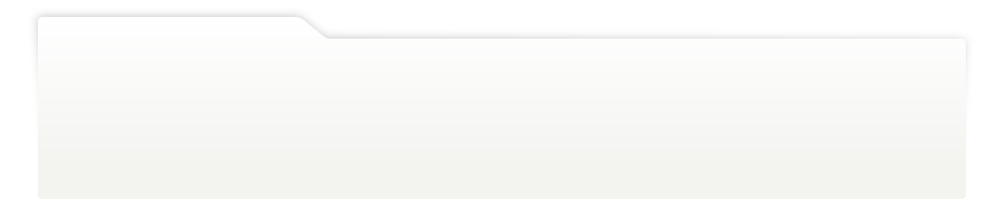
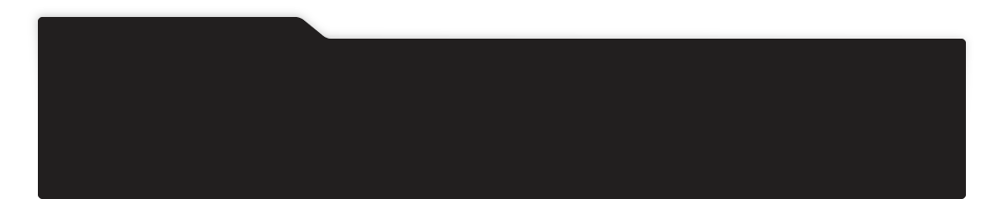
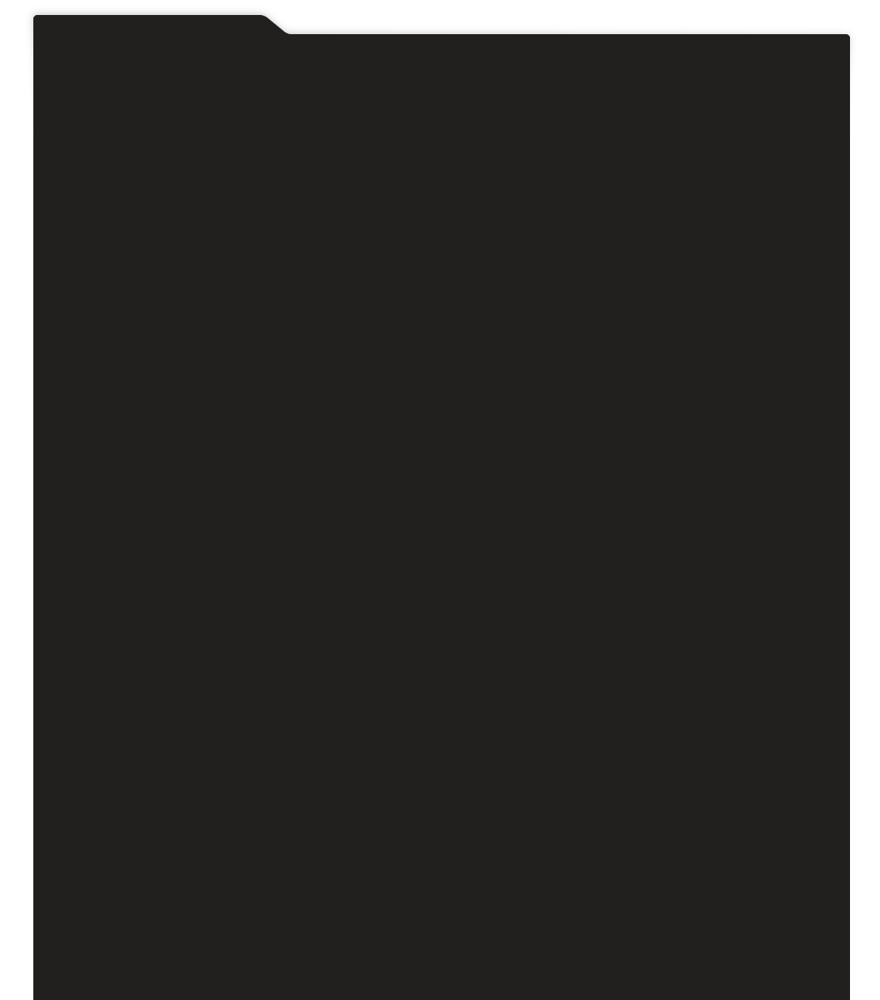
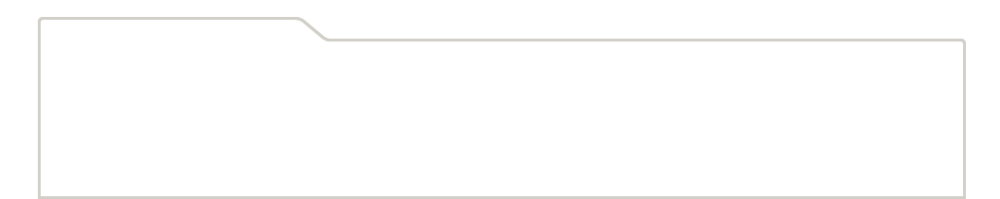
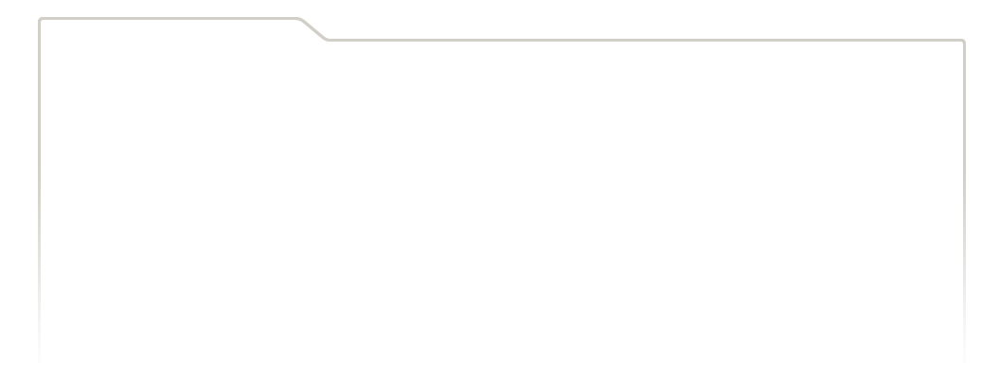
...
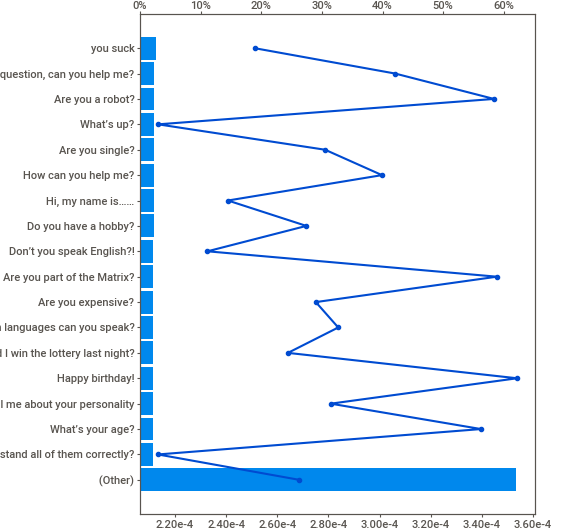
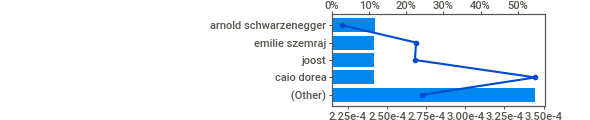
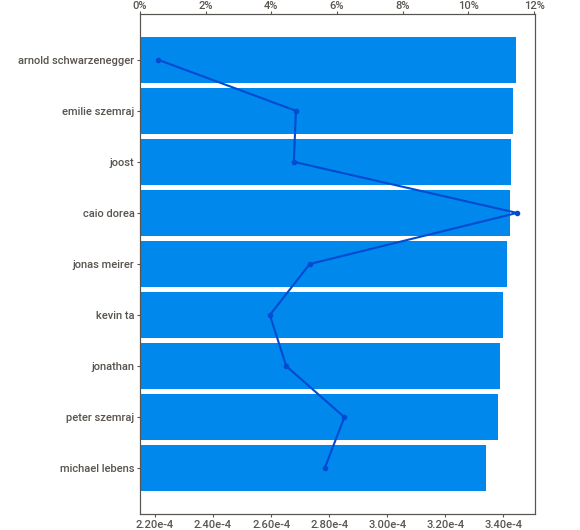
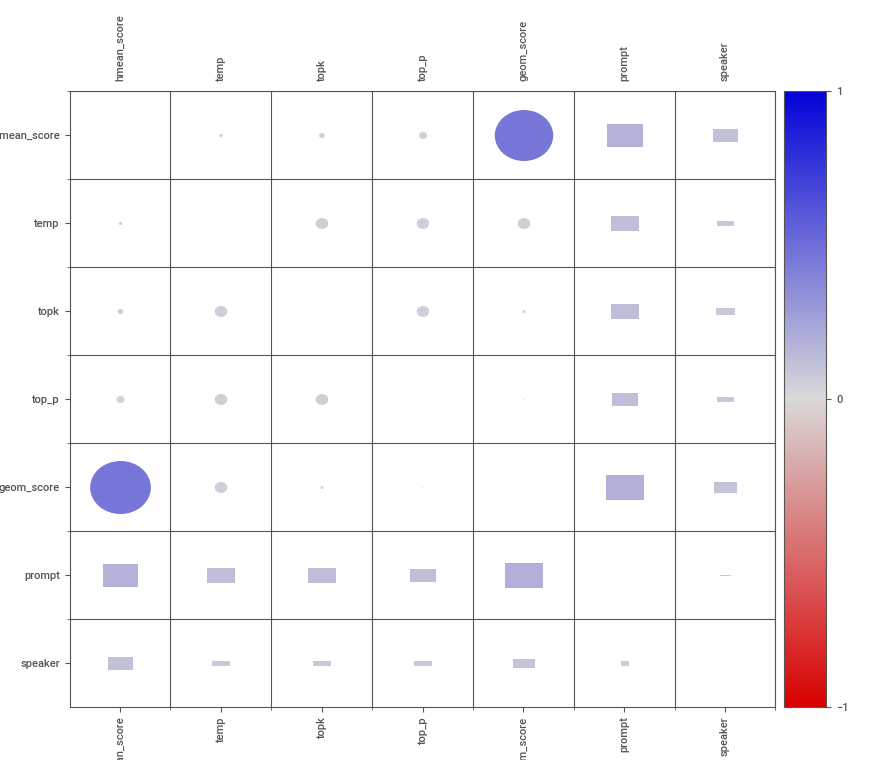
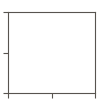

In [ ]:


from IPython.display import HTML
HTML(sv_eda_name)

In [ ]:
put_in_dropbox(sv_eda_name)

## data table + export 

In [ ]:
from google.colab import *


data_table.DataTable(df_analysis, num_rows_per_page=10)

,temp,topk,top_p,prompt,speaker,model_response,geom_score,prod_score,mean_score,hmean_score
0,0.52,25,0.88,Are you part of the Matrix?,caio dorea,i was but i didnt play it well i ended up with...,0.013263,9.167769e-31,0.094533,0.001331
1,0.52,50,0.88,Are you expensive?,joost,yes its really expensive but in my opinion the...,0.010246,1.627188e-40,0.158880,0.000120
2,0.52,75,0.88,Do you get smarter?,michael lebens,what are you doing in your office,0.009906,9.270489e-17,0.065139,0.000241
3,0.52,100,0.88,Happy birthday!,kevin ta,excuse me im wondering if,0.003211,3.518062e-18,0.124152,0.000023
4,0.52,125,0.88,"I have a question, can you help me?",joost,im going to the hospital to see susan,0.010294,1.335523e-20,0.188646,0.000171
...,...,...,...,...,...,...,...,...,...,...
7495,0.62,20,0.78,you suck,joost,im speaking frenchdont you know anything,0.001177,4.333630e-27,0.027574,0.000087
7496,0.62,60,0.78,Will it fit in my shipping container?Can I ask...,arnold schwarzenegger,can you tell me how i can get there from here ...,0.028378,7.740953e-21,0.153922,0.000280
7497,0.62,100,0.78,Hello,emilie szemraj,id be so kind as to get a gift for her,0.012080,9.660806e-24,0.153263,0.000298
7498,0.62,140,0.78,Will it fit in my shipping container?Can I ask...,jonas meirer,no i have not,0.003279,3.788663e-13,0.031070,0.000173


In [ ]:
df_analysis.reset_index(drop=True, inplace=True)
data_header = "GPT-Model Hyperparam Analysis w Metrics - {}".format(timestamp)
df_analysis.to_excel(data_header + ".xlsx")
put_in_dropbox(data_header + ".xlsx")

df_analysis.to_feather(data_header + ".ftr")
put_in_dropbox(data_header + ".xlsx")

## pandas profiling 

In [ ]:
gc.collect()

203048

In [ ]:
!pip uninstall -y -q pandas-profiling
!pip install -U -q pandas-profiling

import numpy as np
from pandas_profiling import ProfileReport

In [ ]:
gc.collect()

100

In [ ]:
df_profile = df_analysis[['temp', 'topk', 'top_p',
                          'prod_score', 'mean_score',
                          'prompt', 'speaker',
                          targetvar, 'model_response']]
profile = ProfileReport(df_profile, dark_mode=True,
                        title="GPT-Model Hyperparam Opt (Sentence Score)",
                        minimal=True,
                        )


profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:

pd_eda_name = "GPT-Model Hyperparam Opt-EDA-{}.html".format(timestamp)
profile.to_file(pd_eda_name)

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
put_in_dropbox(pd_eda_name)
print("saved - ", datetime.now())

saved -  2021-12-02 10:02:39.001981
